<a href="https://colab.research.google.com/github/djoneyhub/deepLearning-machineLearning/blob/main/churnML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
ad
import numpy as np
import pandas as pd
import seaborn as sns
import seaborn as sns
from sklearn import datasets
from IPython.display import Image
from IPython.display import clear_output
from sklearn import tree
from numpy import sqrt
sns.set_style("darkgrid")
import collections
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
#------------------------Data Import--------------------------------------
from google.colab import files
uploaded = files.upload()
import io
from google.colab import data_table

data_table.enable_dataframe_formatter()

dT = pd.read_csv(io.BytesIO(uploaded['Churn_Modelling.csv']))
display(data_table.DataTable(dT, include_index=True, num_rows_per_page=10))
# Dataset is now stored in a Pandas Datafram



Saving Churn_Modelling.csv to Churn_Modelling.csv


,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


#**===========EDA=============**

In [ ]:
#EXPLORATION
print(dT.shape)
print(dT.info())
print(dT.isnull().sum())
print(dT.duplicated().sum())
print(dT.describe())

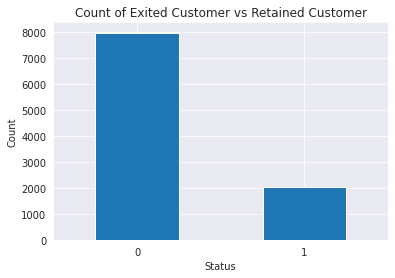

In [ ]:
#VISUALISATION
dT.Exited.value_counts().plot(kind="bar")
plt.title("Count of Exited Customer vs Retained Customer")
plt.xlabel("Status")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

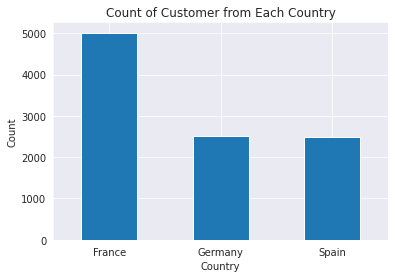

In [ ]:
dT.Geography.value_counts().plot(kind="bar")
plt.title("Count of Customer from Each Country")
plt.xlabel("Country")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

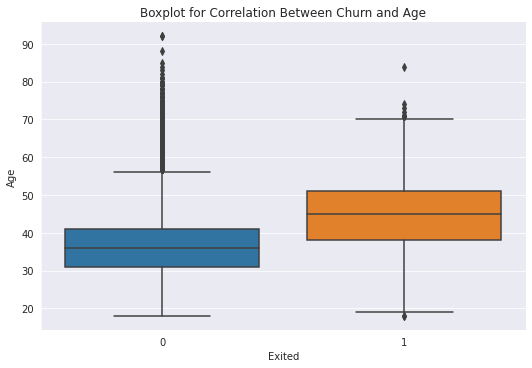

In [ ]:
sns.catplot(x="Exited", y="Age", data=dT, kind="box", aspect=1.5)
plt.title("Boxplot for Correlation Between Churn and Age")
plt.show()

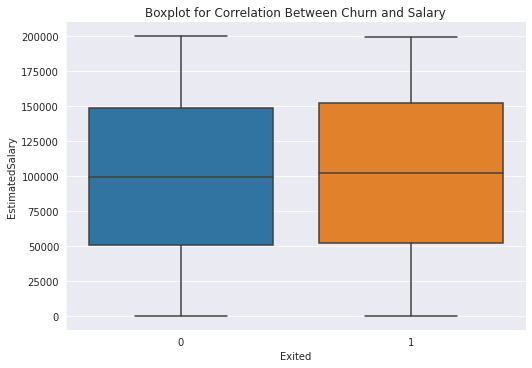

In [ ]:
sns.catplot(x="Exited", y="EstimatedSalary", data=dT, kind="box", aspect=1.5)
plt.title("Boxplot for Correlation Between Churn and Salary")
plt.show()

# **==============DATA PREPROCESSING==================**

In [ ]:
#------------------------DataPreprocessing---------------------------------

#change column name into camel case
dT.columns = dT.columns.str.lower()
#dT.columns

dT.columns = ['rowNumber', 'custId', 'surName', 'creditScore', 'geography',
            'gender', 'age', 'tenure', 'balance', 'numOfProducts', 'hasCrCard',
            'isActiveMember', 'estimatedSalary', 'exited']
#print(dT.columns)

print(dT.shape)


(10000, 14)


In [ ]:
#dropping non useful column
cols = ['rowNumber', 'custId', 'surName']
dT = dT.drop(cols, axis=1)
#print(dT.info())


In [ ]:
#===================ONE HOT ENCODING==========================================
#turning string and object into diff colum
dummies = []
cols = ['geography', 'gender']
for col in cols:
   dummies.append(pd.get_dummies(dT[col]))

#merge new column into the oldd column
dT_dummies = pd.concat(dummies, axis=1)
dT = pd.concat((dT,dT_dummies), axis=1)
dT = dT.drop(['geography','gender'], axis=1)
print(dT.info())
dT.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   creditScore      10000 non-null  int64  
 1   age              10000 non-null  int64  
 2   tenure           10000 non-null  int64  
 3   balance          10000 non-null  float64
 4   numOfProducts    10000 non-null  int64  
 5   hasCrCard        10000 non-null  int64  
 6   isActiveMember   10000 non-null  int64  
 7   estimatedSalary  10000 non-null  float64
 8   exited           10000 non-null  int64  
 9   France           10000 non-null  uint8  
 10  Germany          10000 non-null  uint8  
 11  Spain            10000 non-null  uint8  
 12  Female           10000 non-null  uint8  
 13  Male             10000 non-null  uint8  
dtypes: float64(2), int64(7), uint8(5)
memory usage: 752.1 KB
None


,creditScore,age,tenure,balance,numOfProducts,hasCrCard,isActiveMember,estimatedSalary,exited,France,Germany,Spain,Female,Male
0,619,42,2,0.00,1,1,1,101348.88,1,1,0,0,1,0
1,608,41,1,83807.86,1,0,1,112542.58,0,0,0,1,1,0
2,502,42,8,159660.80,3,1,0,113931.57,1,1,0,0,1,0
3,699,39,1,0.00,2,0,0,93826.63,0,1,0,0,1,0
4,850,43,2,125510.82,1,1,1,79084.10,0,0,0,1,1,0


In [ ]:
#Separating features and labels
X = dT.drop(['exited'], axis=1)
y = dT['exited']

# **===========DATA SAMPLING(RF)=============**

In [ ]:
#Splitting data into training and testing set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

In [ ]:
#training for oversampled random forest with SMOTE
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
#Use SMOTE to oversample the minority class
oversample = SMOTE(random_state = 42)
over_X, over_y = oversample.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(over_X, over_y, test_size = 0.2, random_state = 42, stratify = over_y)
type(over_y)
over_y = over_y.to_frame()
over_y.info()
over_X.info()
df2 = over_y.groupby(['exited'])['exited'].count()
print(df2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15926 entries, 0 to 15925
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   exited  15926 non-null  int64
dtypes: int64(1)
memory usage: 124.5 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15926 entries, 0 to 15925
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   creditScore      15926 non-null  int64  
 1   age              15926 non-null  int64  
 2   tenure           15926 non-null  int64  
 3   balance          15926 non-null  float64
 4   numOfProducts    15926 non-null  int64  
 5   hasCrCard        15926 non-null  int64  
 6   isActiveMember   15926 non-null  int64  
 7   estimatedSalary  15926 non-null  float64
 8   France           15926 non-null  uint8  
 9   Germany          15926 non-null  uint8  
 10  Spain            15926 non-null  uint8  
 11  Female           15926 non-null  ui

In [ ]:
#Checking
print("over_y data type: ", type(over_y))
print("\n over_y components:\n", over_y.info())
print("\n over_X components: \n", over_X.info())
df2 = over_y.groupby(['exited'])['exited'].count()
print("Count of exited vs retained customer: ", df2)
#---------------------------------------------------
print("\nArray shape for training and testing data:")
print(X_train.shape, X_test.shape)
print("\nTraining data data types:")
print(X_train.dtypes)
print("\nTesting data types:")
print(X_test.dtypes)

# **=========DATA SAMPLING(DT)=========**

In [ ]:
#Splitting data into training and testing dataset
#Splitting data into training and testing set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

# **===============MODELLING(RF)========================**



In [ ]:
#-----------------------RANDOM FOREST CLASSIFIER MODELLING--------------------------------
# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from statistics import mean

# instantiate the classifier
rfc = RandomForestClassifier(n_estimators= 13, min_samples_split= 2, min_samples_leaf= 5, max_features= 4, max_depth= 5, bootstrap= True)
#n_estimators = 13,random_state=42
rfc.fit(X_train,y_train)

feature_list = list(X.columns)

#Predict
prediction = rfc.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      1593
           1       0.87      0.82      0.84      1593

    accuracy                           0.85      3186
   macro avg       0.85      0.85      0.85      3186
weighted avg       0.85      0.85      0.85      3186



In [ ]:
#Create Stratified K-fold cross validation
kcv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scoring = ('f1', 'recall', 'precision')
#Evaluate SMOTE SRF model
scores = cross_validate(rfc, X_train, y_train, scoring=scoring, cv=kcv)
#Get average evaluation metrics
print('Mean f1: %.3f' % mean(scores['test_f1']))
print('Mean recall: %.3f' % mean(scores['test_recall']))
print('Mean precision: %.3f' % mean(scores['test_precision']))

Mean f1: 0.845
Mean recall: 0.822
Mean precision: 0.869


In [ ]:
# Check accuracy score
from sklearn.metrics import accuracy_score

print('Model accuracy score with hyperparameter decision-trees : {0:0.4f}'. format(accuracy_score(y_test, prediction)))

Model accuracy score with hyperparameter decision-trees : 0.8459


#**=========MODELING(DT)===========**

In [ ]:
# Create Decision Tree classifer object
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

dtc = DecisionTreeClassifier(criterion = "entropy", max_depth = 5 )

# Train Decision Tree Classifer
dtc = dtc.fit(X_train,y_train)

#Predict the response for test dataset
prediction = dtc.predict(X_test)

X_train.info()
y_train = y_train.to_frame()
y_train.info()

df2 = y_train.groupby(['exited'])['exited'].count()
print(df2)


In [ ]:
#Create Stratified K-fold cross validation
kcv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scoring = ('f1', 'recall', 'precision')
#Evaluate SMOTE SRF model
scores = cross_validate(dtc, X_train, y_train, scoring=scoring, cv=kcv)
#Get average evaluation metrics
print('Mean f1: %.3f' % mean(scores['test_f1']))
print('Mean recall: %.3f' % mean(scores['test_recall']))
print('Mean precision: %.3f' % mean(scores['test_precision']))

Mean f1: 0.529
Mean recall: 0.405
Mean precision: 0.777


In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, prediction))

# **=================Score Feature=========================**

In [ ]:
#====================SCORE FEATURE ============================

#GETTING PROBABILITY ASSIGN TO EACH PREDICTION
print("probalbility assigned to each prediction:\n")
print(rfc.predict_proba(X_test))


probalbility assigned to each prediction:

[[0.57286117 0.42713883]
 [0.02305903 0.97694097]
 [0.79146222 0.20853778]
 ...
 [0.80414236 0.19585764]
 [0.75660447 0.24339553]
 [0.78502196 0.21497804]]


In [ ]:
# Predict on the test set results and find important features

y_pred = rfc.predict(X_test)
print("predictions:\n")

predictions:



In [ ]:
# Check accuracy score

from sklearn.metrics import accuracy_score

print('Model accuracy score with decision-trees : {0:0.4f}'. format(accuracy_score(y_test, prediction)))

estimatedSalary    0.001375
creditScore        0.001979
tenure             0.002430
hasCrCard          0.007829
Germany            0.010456
balance            0.012755
Spain              0.031237
France             0.080664
Female             0.109765
Male               0.114412
numOfProducts      0.155938
isActiveMember     0.187501
age                0.283659
dtype: float64


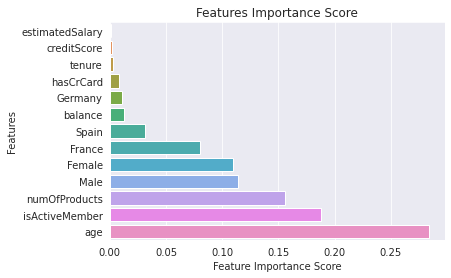

In [ ]:

#feature score
feature_scores = pd.Series(rfc.feature_importances_, index=X_train.columns).sort_values(ascending= True)
print(feature_scores)

#SCORE FEATURE VISUALISATION
# Creating a seaborn bar plot
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Features Importance Score")

# Visualize the graph
plt.show()

# **======================VALIDATION===============================**

[[1393  200]
 [ 291 1302]]


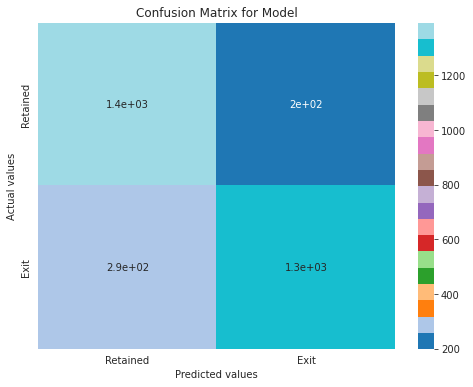

In [ ]:
#Confusion Matrix
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
confMatrix = confusion_matrix(y_test, prediction)
print(confMatrix)

#Visualizing Confusion Matrix
plt.figure(figsize=(8,6))
sns.heatmap(confMatrix, cmap='tab20', annot=True, xticklabels=['Retained', 'Exit'], yticklabels=['Retained', 'Exit'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for Model')
plt.show()


In [ ]:
#analyze and compare to original list
#prediction comparison
yTest = pd.DataFrame(y_test)
yTest = yTest.rename(columns = {0:'Original Prediction'})

orgPredict = rfc.predict(X_test)
dP = pd.DataFrame(orgPredict,columns = ['churnPrediction'])
result = pd.concat([yTest, dP], axis=1, join='inner')
display(result)

print ('y_test ' + str(type(yTest)))
print ('dP' + str(type(dP)))


# **=====================VISUALISATION==========================**

In [ ]:


# MODULES
import pydot
import pydotplus
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree


[Text(0.4346590909090909, 0.9166666666666666, 'age <= 41.5\ngini = 0.5\nsamples = 8078\nvalue = [6423, 6317]'),
 Text(0.17045454545454544, 0.75, 'Male <= 0.5\ngini = 0.434\nsamples = 4567\nvalue = [4923, 2299]'),
 Text(0.06818181818181818, 0.5833333333333334, 'Female <= 0.5\ngini = 0.496\nsamples = 2433\nvalue = [2090, 1750]'),
 Text(0.045454545454545456, 0.4166666666666667, 'gini = 0.0\nsamples = 500\nvalue = [0, 791]'),
 Text(0.09090909090909091, 0.4166666666666667, 'numOfProducts <= 1.5\ngini = 0.431\nsamples = 1933\nvalue = [2090, 959]'),
 Text(0.045454545454545456, 0.25, 'France <= 0.5\ngini = 0.49\nsamples = 1081\nvalue = [972, 728]'),
 Text(0.022727272727272728, 0.08333333333333333, 'gini = 0.498\nsamples = 625\nvalue = [466, 529]'),
 Text(0.06818181818181818, 0.08333333333333333, 'gini = 0.405\nsamples = 456\nvalue = [506, 199]'),
 Text(0.13636363636363635, 0.25, 'age <= 34.5\ngini = 0.284\nsamples = 852\nvalue = [1118, 231]'),
 Text(0.11363636363636363, 0.08333333333333333, 'g

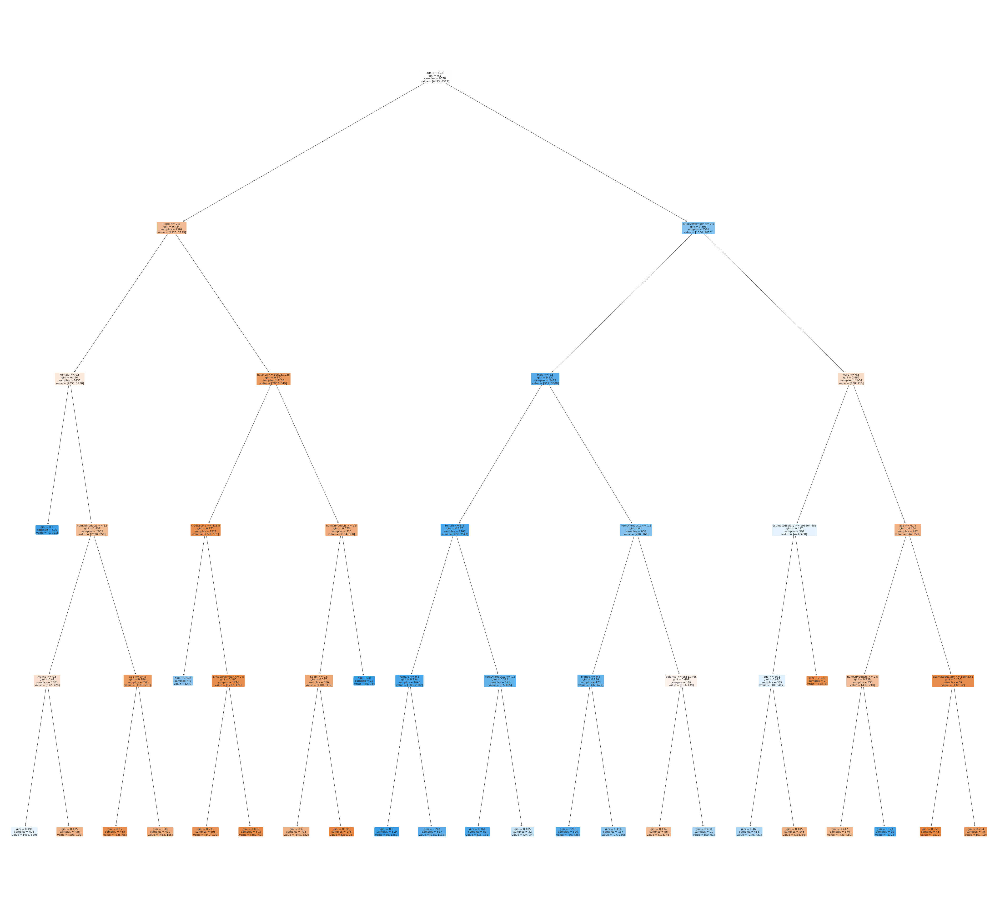

In [ ]:
#big tree
fig = plt.figure(figsize=(75,70))
plot_tree(rfc.estimators_[0],
          feature_names=feature_list,
          filled=True, impurity=True,
          rounded=True)

In [ ]:

#REDUCED TREE
# Limit depth of tree to 3 levels
rf_small = RandomForestClassifier(n_estimators=10, max_depth = 3)
rf_small.fit(X_train, y_train)

fig = plt.figure(figsize=(25, 20))
plot_tree(rf_small.estimators_[5],
          feature_names=feature_list,
          filled=True, impurity=True,
          rounded=True)

In [ ]:
#HEATMAP
#Variable Correlation
sns.heatmap(dT.corr(),
            xticklabels=dT.columns,
            yticklabels=dT.columns)

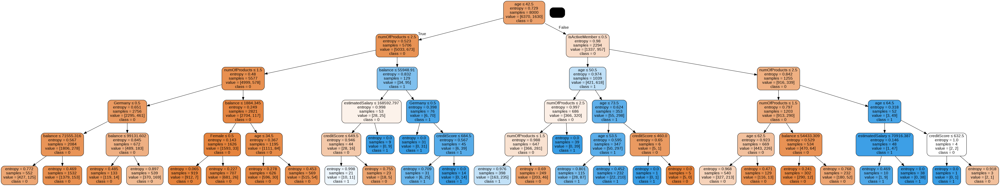

In [ ]:
#DECISION TREE VISUALISATION
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
feature_list = list(X_train.columns)

from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_list,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('decisionTree.png')
Image(graph.create_png())


# **=================USER INTERFACE PORTION======================**

In [ ]:

#Taking input from user
creditScore = int(input("Enter Credit Score: \n"));
age = int(input("Enter Member's Age : \n"));
tenure = int(input("Enter Member's Tenure : \n"));
balance = float(input ("Enter Member's Balance: \n"));
numOfProducts = int(input("Enter Number of Product Uses: \n"));
estimatedSalary  = float(input("Enter Member's Estimated Salary: \n"));
print("=====================================================================")
print("=below is a series of yes or no question. put 1 for yes and 0 for no=")
hasCrCard = int(input("Does The Member Own Credit Card: \n"));
isActiveMember = int(input("Is The Member Active: \n"));
France = int(input("Is The Member Located in France: \n"));
if France == 1:
  print("Is The Member Located in Germany:\n")
  print("0")
  Germany = 0
  print ("Is The Member Located in Spain: \n")
  print("0")
  Spain = 0
elif France != 1:
  Germany = int(input("Is The Member Located in Germany: \n"))
  if Germany == 1:
    print("Is The Member Located in Spain:\n")
    print("0")
    Spain = 0
  else:
    print("Is The Member Located in Spain:\n")
    print("1")
    Spain = 1

Female = int(input("Is The Member Female: \n"))
if Female == 1:
  print("Is The Member Male: \n")
  print("0")
  Male = 0
else:
  Male = print("Is The Member Male: \n")
  print("1")
  Male = 1

#turning input into dataframe table
predictList = [creditScore, age, tenure, balance, numOfProducts, hasCrCard, isActiveMember, estimatedSalary,France, Germany, Spain, Female, Male]
predictList = pd.DataFrame(predictList)
predictList = predictList.transpose()
predictList.columns = ['creditScore','age','tenure', 'balance', 'numOfProducts', 'hasCrCard', 'isActiveMember', 'estimatedSalary','France', 'Germany','Spain', 'Female', 'Male']
predictList = predictList.astype({"creditScore":'int', "age":'int', "tenure":'int', "numOfProducts":'int', "hasCrCard":'int', "isActiveMember":'int', "France":'int', "Germany":'int', "Spain":'int', "Female":'int', "Male":'int'})




Enter Credit Score: 
600
Enter Member's Age : 
24
Enter Member's Tenure : 
2
Enter Member's Balance: 
10300
Enter Number of Product Uses: 
3
Enter Member's Estimated Salary: 
15000
=below is a series of yes or no question. put 1 for yes and 0 for no=
Does The Member Own Credit Card: 
1
Is The Member Active: 
1
Is The Member Located in France: 
1
Is The Member Located in Germany:

0
Is The Member Located in Spain: 

0
Is The Member Female: 
1
Is The Member Male: 

0


In [ ]:
#getting prediction verdict
outcome = rfc.predict(predictList)
#print(outcome)
if outcome == 0 :
  outcome = ["retained"]
  outcome = pd.DataFrame(outcome, columns = ['predictionVerdict'])
else:
  outcome = ["account closed"]
  outcome = pd.DataFrame(outcome, columns = ['predictionVerdict'])

In [ ]:
#getting probability prediction for both outcome
outcomeProba = rfc.predict_proba(predictList)
#turning into percentage
outcomeProba = [i * 100 for i in outcomeProba]
outcomeProba = [np.around(i, 2) for i in outcomeProba]
#print(outcomeProba)
#turning into data frame
outcomeProba= pd.DataFrame(outcomeProba, columns = ['retainProbability(%)', 'exitProbability(%)'])

In [ ]:
#joining the table
result1 = pd.concat([predictList, outcome], axis=1, join='inner')
result = pd.concat([result1, outcomeProba], axis = 1, join = 'inner')
clear_output()
display(result)

,creditScore,age,tenure,balance,numOfProducts,hasCrCard,isActiveMember,estimatedSalary,France,Germany,Spain,Female,Male,predictionVerdict,retainProbability(%),exitProbability(%)
0,600,24,2,10300.0,3,1,1,15000.0,1,0,0,1,0,retained,50.01,49.99


In [ ]:
#-----------------------Data exploration----------------------------------
#getting sample data
#dT.head()
#dT.info()
#features.describe
#print(dT.dtypes)
